In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import warnings

warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import random
import numpy as np
from seirsplus.networks import generate_demographic_contact_network, household_country_data
from seirsplus.viral_model import ViralExtSEIRNetworkModel
from seirsplus.sim_loops_pooled_test import SimulationRunner

## Note: these are results of experiments started 9/4 afternoon, submitted to G2. We modified the transmission mechanism so that positives start becoming infectious earlier, and decreased the density of inter-household edges

In [4]:
import os

os.listdir('/home/yz685/corr_pooling_seirsplus/results/')

['deprecated',
 'US_pop_size=10000_init_prev=0.001_num_groups=10_pool_size=10_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.01_num_groups=10_pool_size=10_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.01_num_groups=10_pool_size=5_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.1_num_groups=10_pool_size=20_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.001_num_groups=10_pool_size=30_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.1_num_groups=10_pool_size=5_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.001_num_groups=10_pool_size=5_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=174',
 'US_pop_size=10000_init_prev=0.1_num_groups=10_pool_size=30_horizon=100_beta=0.5_sigma=0.2_lamda=0.5_gamma=0.25_LoD=17

In [5]:
import pickle

NUM_TRIALS = 20


param_config = {
    "country": ["US"],

    "pop_size_default": 10000,

    "init_prev": [0.001, 0.01],
    "init_prev_default": 0.01,

    'horizon_default': 100,

    "num_groups_default": 5,
    # "num_groups": [1, 5],
    "num_groups": [1,2,3,4,5],

    'pool_size': [5,10,20,30],
    'pool_size_default': 10,

    'LoD_default': 1240,
    'LoD': [1240],

    "edge_weight_default": 10,
    "edge_weight": [10],

    "alpha_default": 5.0,
    # "alpha": [1.0, 2.0, 5.0],
    "alpha": [2.0],

    "peak_VL": [6.0],

    "distancing_scale": [50.0, 100.0],

    "beta_default": 0.1, # transmissibility
    "sigma_default": 0.2, # rate E --> I_pre
    "lamda_default": 0.5, # rate I_pre --> I_(a)sym
    "gamma_default": 0.25 # rate I_sym --> R
}


In [6]:
import itertools

param_values = {}

for param in [
        "country", "pop_size", "init_prev", "num_groups", "pool_size", "horizon", 
        "beta", "sigma", "lamda", "gamma", "LoD", "edge_weight", "alpha", "peak_VL",
        "distancing_scale"
    ]:
        if param in param_config:
            param_values[param] = param_config[param]
        else:
            param_values[param] = [param_config[param+"_default"]]

all_param_configs = [dict(zip(param_values.keys(), x)) for x in itertools.product(*param_values.values())]

In [6]:
all_param_configs

[{'country': 'US',
  'pop_size': 10000,
  'init_prev': 0.001,
  'num_groups': 5,
  'pool_size': 10,
  'horizon': 100,
  'beta': 0.1,
  'sigma': 0.2,
  'lamda': 0.5,
  'gamma': 0.25,
  'LoD': 1240,
  'edge_weight': 10,
  'alpha': 2.0,
  'peak_VL': 6.0,
  'distancing_scale': 100.0},
 {'country': 'US',
  'pop_size': 10000,
  'init_prev': 0.001,
  'num_groups': 5,
  'pool_size': 10,
  'horizon': 100,
  'beta': 0.1,
  'sigma': 0.2,
  'lamda': 0.5,
  'gamma': 0.25,
  'LoD': 1240,
  'edge_weight': 10,
  'alpha': 2.0,
  'peak_VL': 6.0,
  'distancing_scale': 10.0},
 {'country': 'US',
  'pop_size': 10000,
  'init_prev': 0.01,
  'num_groups': 5,
  'pool_size': 10,
  'horizon': 100,
  'beta': 0.1,
  'sigma': 0.2,
  'lamda': 0.5,
  'gamma': 0.25,
  'LoD': 1240,
  'edge_weight': 10,
  'alpha': 2.0,
  'peak_VL': 6.0,
  'distancing_scale': 100.0},
 {'country': 'US',
  'pop_size': 10000,
  'init_prev': 0.01,
  'num_groups': 5,
  'pool_size': 10,
  'horizon': 100,
  'beta': 0.1,
  'sigma': 0.2,
  'lamda

In [7]:
import copy
from collections import defaultdict
def defaultdict_list():
    return defaultdict(list)

# paths = []

df_data = []

all_data = []
trajectories = [] # list of tuples (dict of param_config_single, dict of {metric: [mean, std]})

for param_config_single in all_param_configs:

    traj_info = [param_config_single, {}]
    
    path = f"/home/yz685/corr_pooling_seirsplus/results/{param_config_single['country']}"
    for param in [
        "pop_size", "init_prev", "num_groups", "pool_size", "horizon", 
        "beta", "sigma", "lamda", "gamma", "LoD", "edge_weight", "alpha", "peak_VL", "distancing_scale"
    ]:
        path += f"_{param}={param_config_single[param]}"

    data = copy.deepcopy(param_config_single)

    # paths.append(path)

    results = defaultdict(list)

    for pooling_strategy in ["naive", "correlated"]:
        for i in range(1, NUM_TRIALS+1):
            filepath = path + f"/{pooling_strategy}/results_{i}.pickle"
            try:
                with open(filepath, "rb") as f:
                    results[pooling_strategy].append(pickle.load(f))
            except Exception as e:
                # print("error: ", e)
                continue

    if len(results["naive"]) == 0:
        continue

    metrics = set(results["correlated"][0][0].keys()) - set(["day", "VL_in_positive_pools"])

    for metric in metrics:
    # for metric in ["cumInfections", "cum_num_tests", "daily_sensitivity", "numActiveInfections", "mean_num_positives_in_positive_pool"]:
        naive_results = []
        correlated_results = []
        for SEED in range(NUM_TRIALS):
            try:
                naive_results.append(
                    [x[metric]\
                    for x in results["naive"][SEED]]
                )
            except:
                pass
            try:
                correlated_results.append(
                    [x[metric]\
                    for x in results["correlated"][SEED]]
                )
            except:
                pass
        print(len(naive_results), len(naive_results[0]))

        naive_results_ = np.array([(xi+[None]*(100-len(xi)))[:100] for xi in naive_results], dtype=float)
        correlated_results_ = np.array([(xi+[None]*(100-len(xi)))[:100] for xi in correlated_results][:100], dtype=float)
        naive_mean = np.nanmean(naive_results_, axis=0)
        naive_sem = np.nanstd(naive_results_, axis=0)/np.sqrt(NUM_TRIALS)
        correlated_mean = np.nanmean(correlated_results_, axis=0)
        correlated_sem = np.nanstd(correlated_results_, axis=0)/np.sqrt(NUM_TRIALS)

        traj_info[1][metric] = [naive_mean, naive_sem, correlated_mean, correlated_sem]

        # print("naive_mean: ", naive_mean)

        # cumulative metrics
        if metric in ["cumInfections", "cum_num_tests"]:
            data[f"{metric}_NP_mean"] = naive_mean[-1]
            data[f"{metric}_CP_mean"] = correlated_mean[-1]
            data[f"{metric}_NP_sem"] = naive_sem[-1]
            data[f"{metric}_CP_sem"] = correlated_sem[-1]
        else:
            data[f"{metric}_NP_mean"] = np.nanmean(naive_mean)
            data[f"{metric}_CP_mean"] = np.nanmean(correlated_mean)
            # data[f"{metric}_NP_sd"] = naive_std[-1]
            # data[f"{metric}_CP_sd"] = correlated_std[-1]
        
    
    all_data.append(data)
    trajectories.append(traj_info)


20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 92
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 100
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20 101
20

In [8]:
for i, j in enumerate(traj_info[1].keys()):
    print(i,j)

0 daily_effective_followup_efficiency
1 numActiveInfections
2 cum_sensitivity
3 median_num_identifiable_positives_in_positive_pool
4 cum_positives_identified
5 cum_positives_screened
6 num_susceptible_neighbors_of_unidentified_positives
7 cumInfections
8 cumRecovered
9 daily_effective_efficiency
10 median_num_positives_in_positive_pool
11 mean_num_positives_in_positive_pool
12 cum_num_tests
13 numQuarantinedInfections
14 num_susceptible_neighbors_of_identified_positives
15 mean_num_identifiable_positives_in_positive_pool
16 daily_sensitivity


In [11]:
# [naive_mean, naive_sem, correlated_mean, correlated_sem]

metric_to_english = {
    "cumInfections": "Cumulative Infections",
    "cum_num_tests": "Cumulative Test Consumption",
    "daily_sensitivity": "Daily Sensitivity",
    "numActiveInfections": "Active Infections",
    "mean_num_positives_in_positive_pool": "Mean # Positives in Positive Pools",
    "mean_num_identifiable_positives_in_positive_pool": "Mean # Identifiable Positives in Positive Pools",
    "daily_effective_efficiency": "Daily Effective Efficiency",
    "daily_effective_followup_efficiency": "Daily Effective Followup Efficiency",
    "num_susceptible_neighbors_of_identified_positives": "# Susceptible Neighbors of Identified Positives",
}

def plot_trajectory(traj_info, metrics_to_plot = None):

    if metrics_to_plot == None:
        metrics_to_plot = traj_info[1].keys()

    # print(f"init_prev={traj_info[0]['init_prev']}, peak_VL={traj_info[0]['peak_VL']}, num_groups={traj_info[0]['num_groups']}, alpha={traj_info[0]['alpha']}, pool_size={traj_info[0]['pool_size']}, LoD={traj_info[0]['LoD']}, edge_weight={traj_info[0]['edge_weight']}, distancing_scale={traj_info[0]['distancing_scale']}")
    print(f"num_groups={traj_info[0]['num_groups']}, pool_size={traj_info[0]['pool_size']}")

    # fig, axs = plt.subplots(1, len(metrics_to_plot), figsize=(5*len(metrics_to_plot), 3))

    fig, axs = plt.subplots(2, (len(metrics_to_plot)+1)//2, figsize=(5*len(metrics_to_plot)/2, 3.5*2))
    fig.tight_layout()

    for i, metric in enumerate(metrics_to_plot):

        row_idx = i // ((len(metrics_to_plot)+1)//2)
        col_idx = i % ((len(metrics_to_plot)+1)//2)
        
        naive_mean = traj_info[1][metric][0]
        naive_std = traj_info[1][metric][1]
        correlated_mean = traj_info[1][metric][2]
        correlated_std = traj_info[1][metric][3]

        axs[row_idx][col_idx].plot(naive_mean, color="mediumpurple", label="naive")
        axs[row_idx][col_idx].fill_between(
            range(len(naive_mean)),
            naive_mean-2*naive_std,
            naive_mean+2*naive_std,
            alpha=0.2,
            color="mediumpurple"
        )
        axs[row_idx][col_idx].plot(correlated_mean, color="mediumseagreen", label="correlated")
        axs[row_idx][col_idx].fill_between(
            range(len(correlated_mean)),
            correlated_mean-2*correlated_std,
            correlated_mean+2*correlated_std,
            alpha=0.2,
            color="mediumseagreen"
        )
        axs[row_idx][col_idx].set_title(metric_to_english[metric])
        axs[row_idx][col_idx].legend()
    plt.show()

num_groups=1, pool_size=5


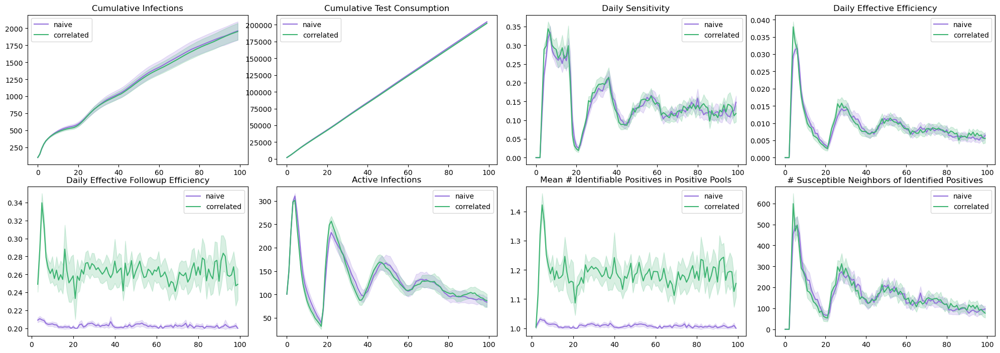

num_groups=1, pool_size=10


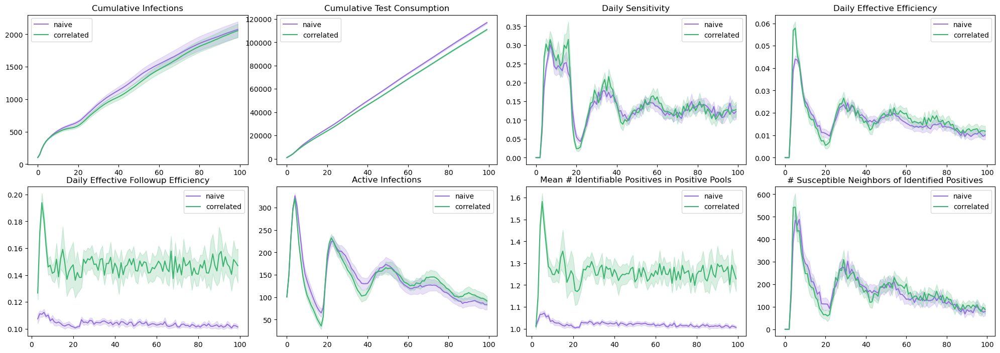

num_groups=1, pool_size=20


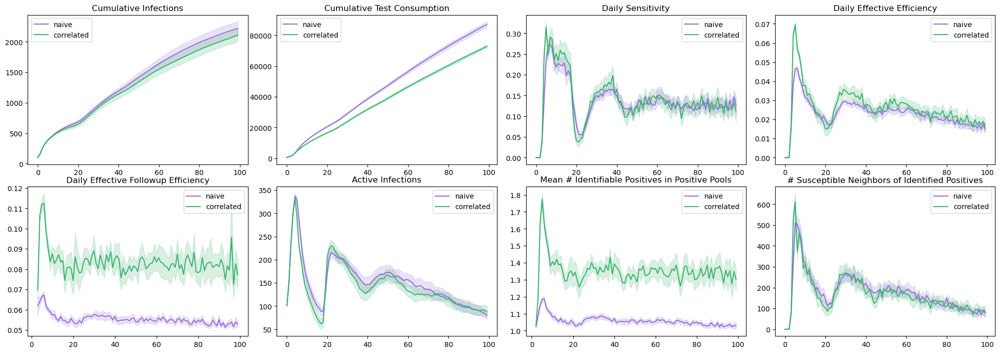

num_groups=1, pool_size=30


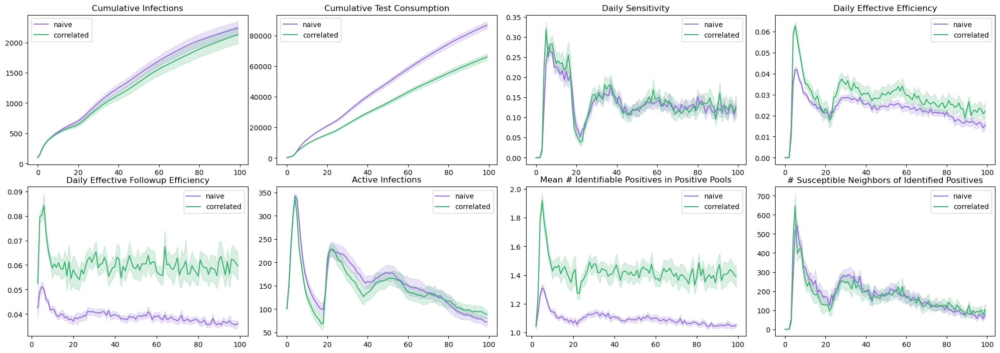

num_groups=2, pool_size=5


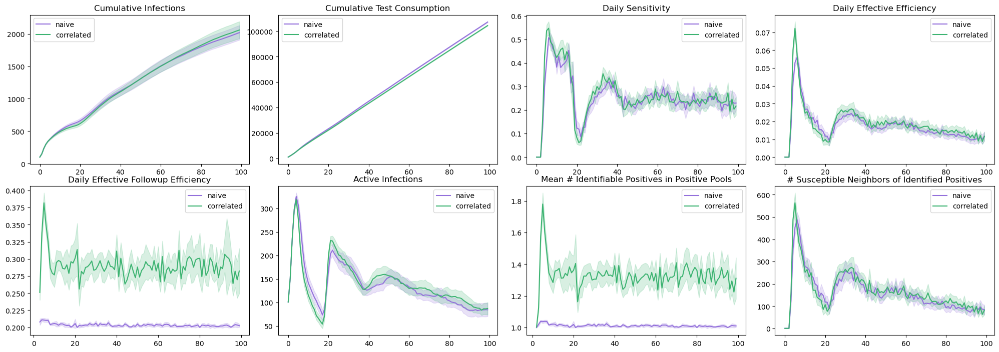

num_groups=2, pool_size=10


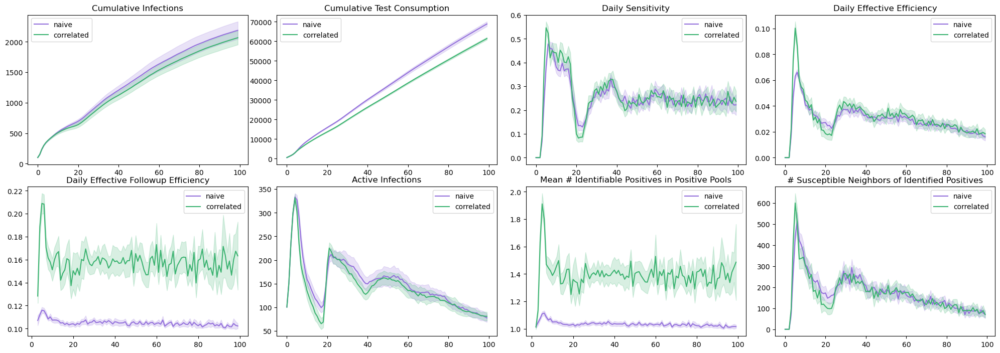

num_groups=2, pool_size=20


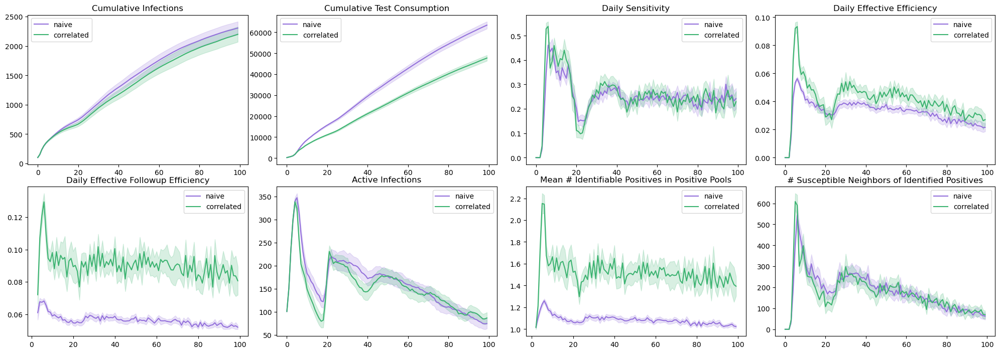

num_groups=2, pool_size=30


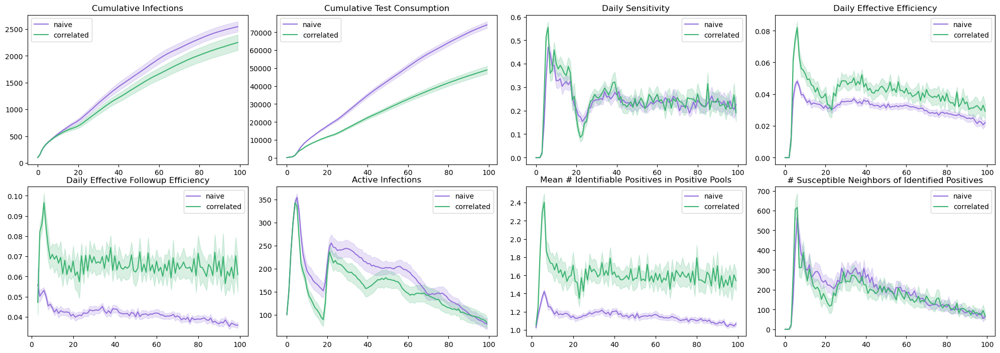

num_groups=3, pool_size=5


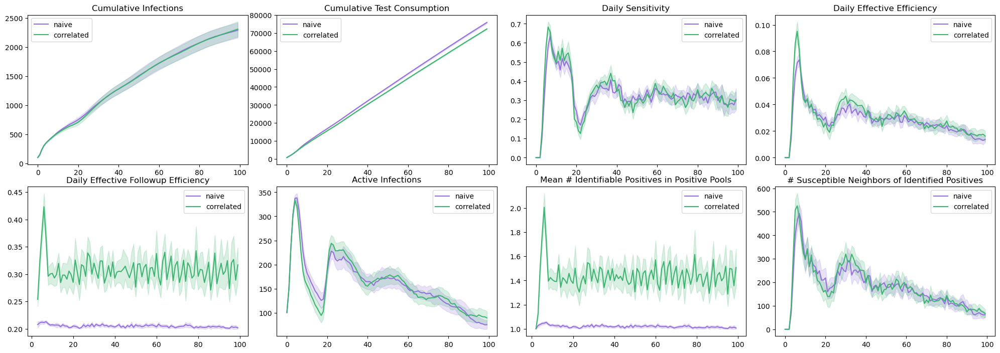

num_groups=3, pool_size=10


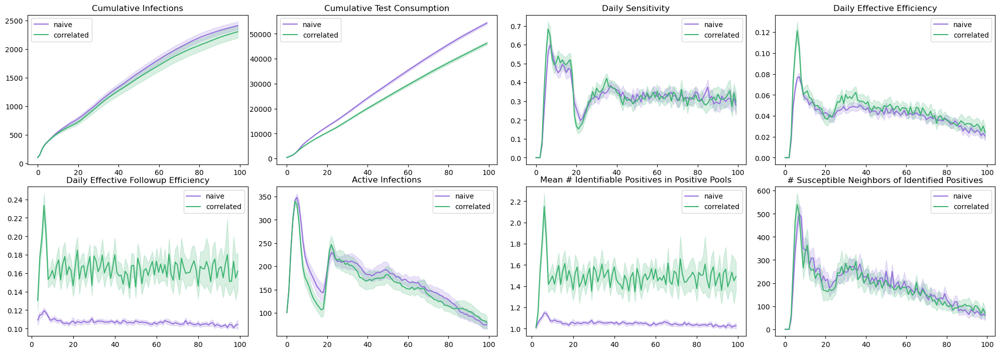

num_groups=3, pool_size=20


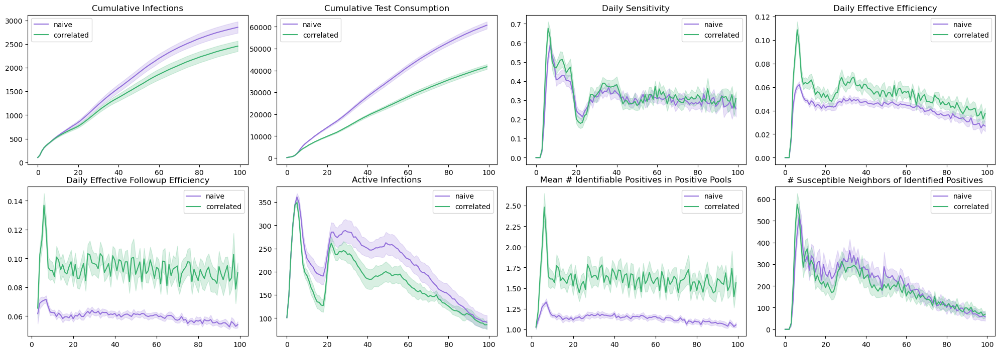

num_groups=3, pool_size=30


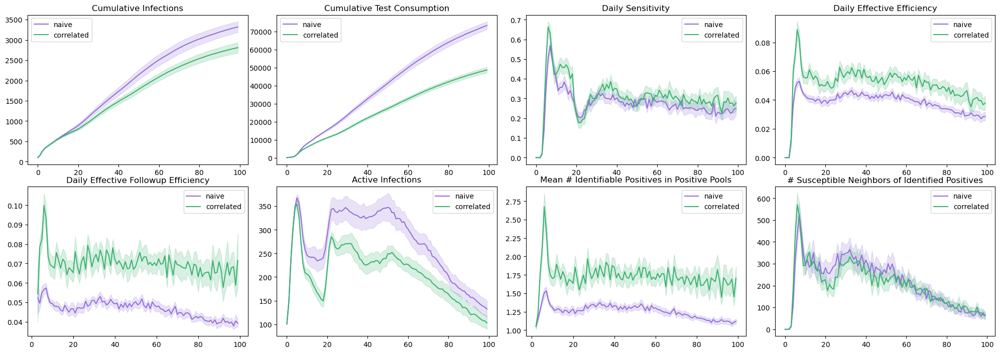

num_groups=4, pool_size=5


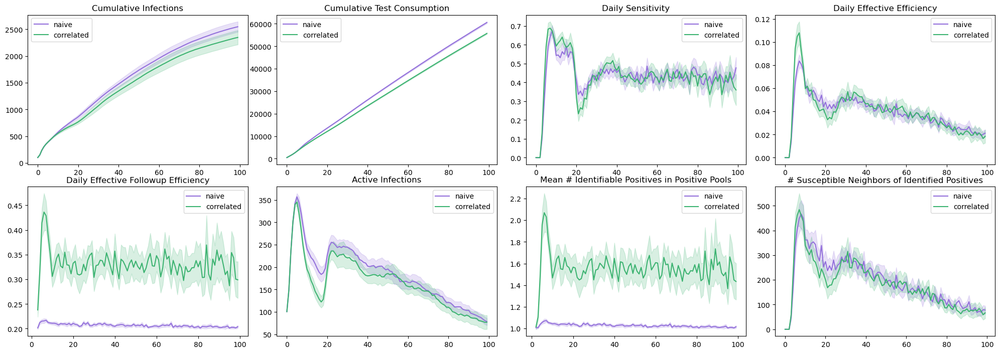

num_groups=4, pool_size=10


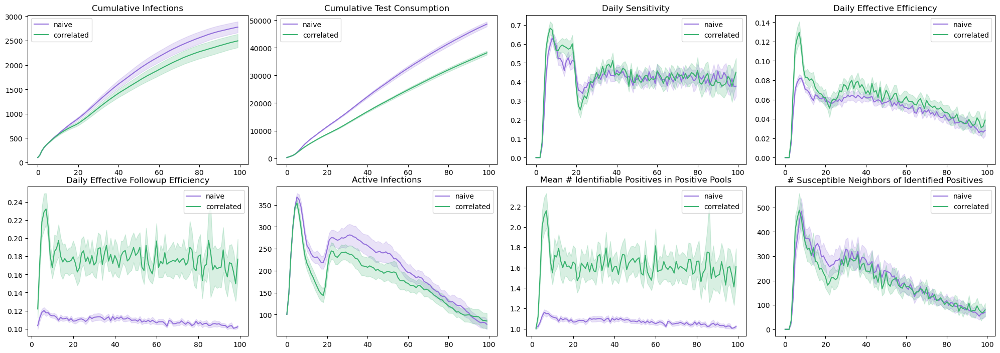

num_groups=4, pool_size=20


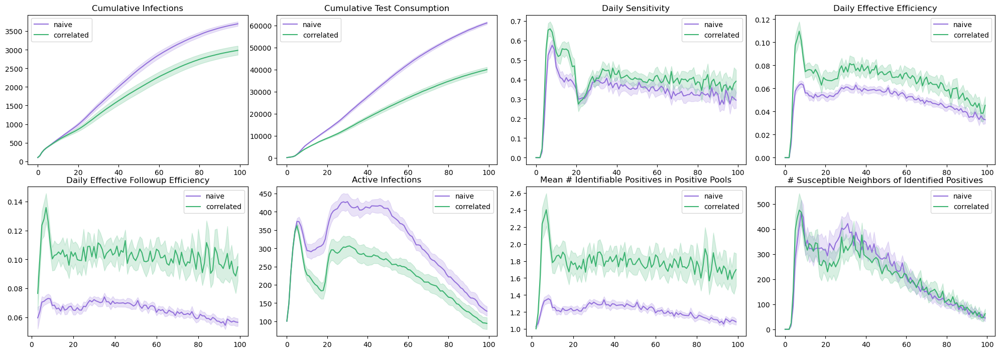

num_groups=4, pool_size=30


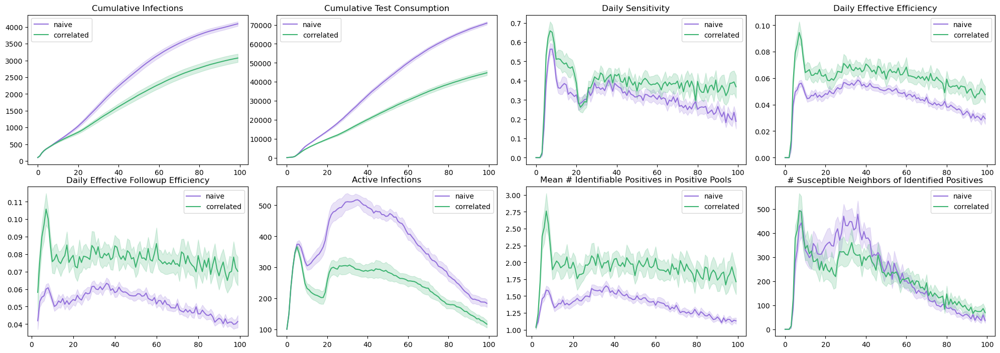

num_groups=5, pool_size=5


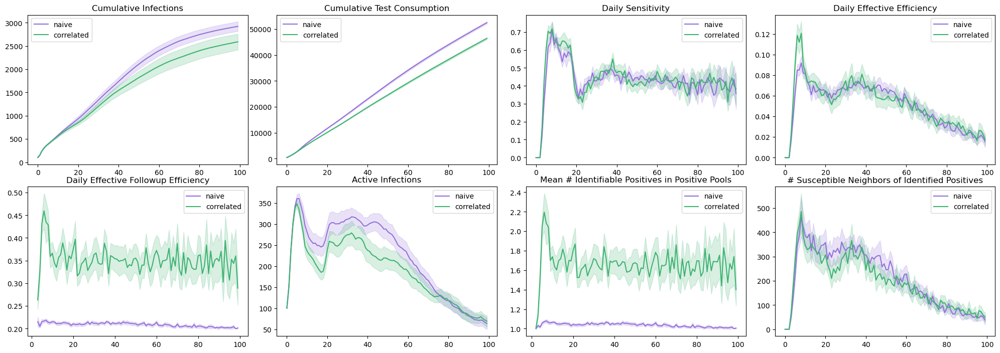

num_groups=5, pool_size=10


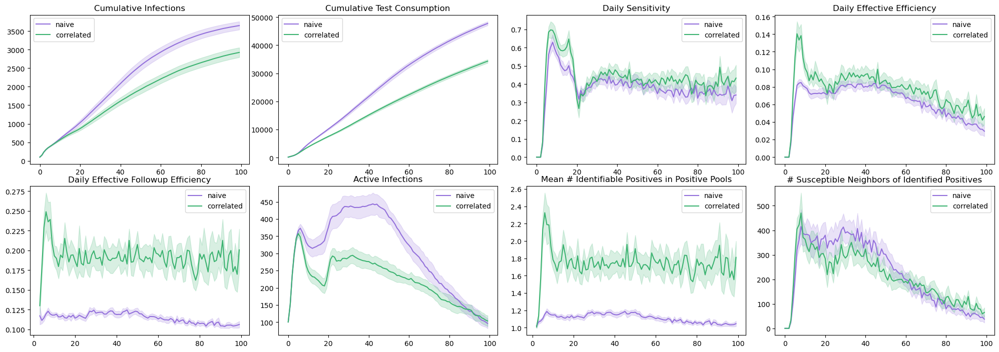

num_groups=5, pool_size=20


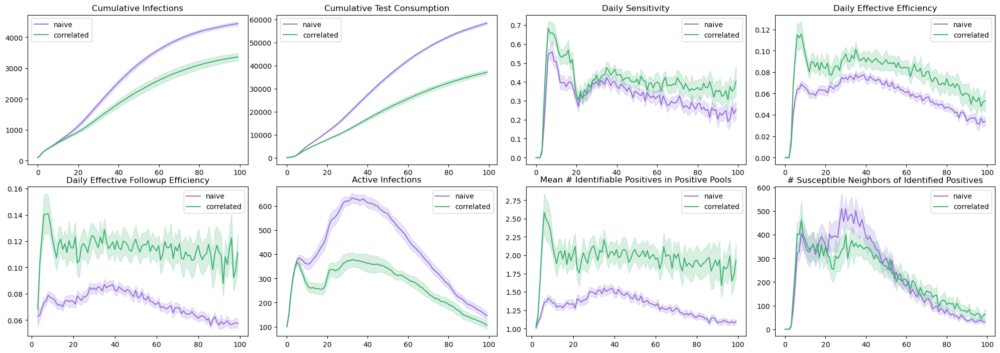

num_groups=5, pool_size=30


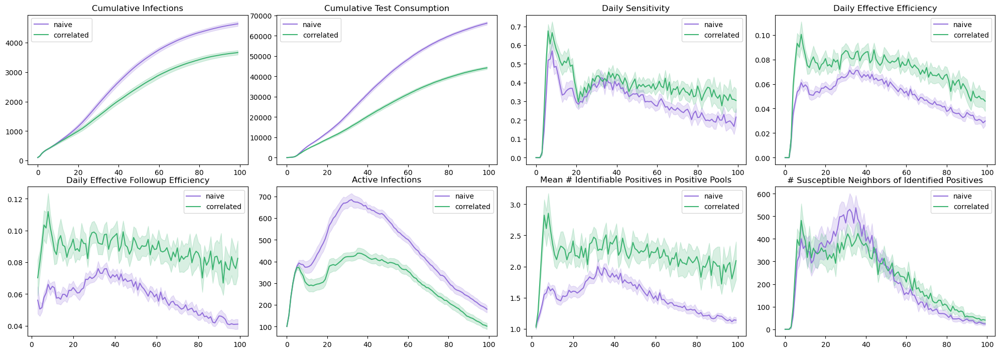

In [12]:
for j in range(len(trajectories)):
    if trajectories[j][0]["distancing_scale"] == 50: # and trajectories[j][0]["num_groups"] == 5:
        plot_trajectory(
            trajectories[j], 
            metrics_to_plot = [
                "cumInfections", 
                "cum_num_tests", 
                "daily_sensitivity",
                "daily_effective_efficiency", 
                "daily_effective_followup_efficiency",
                "numActiveInfections",
                # "mean_num_positives_in_positive_pool",
                # "num_susceptible_neighbors_of_unidentified_positives"
                "mean_num_identifiable_positives_in_positive_pool",
                # "cum_positives_identified"
                "num_susceptible_neighbors_of_identified_positives"
            ]
        )

In [13]:
import pandas as pd
df = pd.DataFrame(all_data)
# df.dropna(inplace=True)


In [14]:
df

,country,pop_size,init_prev,num_groups,pool_size,horizon,beta,sigma,lamda,gamma,...,cum_num_tests_NP_sem,cum_num_tests_CP_sem,numQuarantinedInfections_NP_mean,numQuarantinedInfections_CP_mean,num_susceptible_neighbors_of_identified_positives_NP_mean,num_susceptible_neighbors_of_identified_positives_CP_mean,mean_num_identifiable_positives_in_positive_pool_NP_mean,mean_num_identifiable_positives_in_positive_pool_CP_mean,daily_sensitivity_NP_mean,daily_sensitivity_CP_mean
0,US,10000,0.01,1,5,100,0.1,0.2,0.5,0.25,...,156.198850,71.698657,256.597921,254.3715,161.691526,162.9420,1.008240,1.187345,0.142787,0.146475
1,US,10000,0.01,1,5,100,0.1,0.2,0.5,0.25,...,116.522541,71.452033,370.504000,341.2330,270.742000,257.7105,1.012205,1.189019,0.142178,0.147472
2,US,10000,0.01,1,10,100,0.1,0.2,0.5,0.25,...,472.559660,285.829123,272.056000,267.7390,169.346000,169.3405,1.020664,1.261160,0.138018,0.143601
3,US,10000,0.01,1,10,100,0.1,0.2,0.5,0.25,...,420.325850,293.838597,384.461000,360.7775,276.539500,264.8550,1.032629,1.264567,0.138455,0.142428
4,US,10000,0.01,1,20,100,0.1,0.2,0.5,0.25,...,913.945705,519.394349,290.199500,274.8115,177.643500,171.0490,1.057731,1.351698,0.135807,0.139274
5,US,10000,0.01,1,20,100,0.1,0.2,0.5,0.25,...,1059.595179,703.333684,400.802000,381.0520,279.333500,272.7425,1.080984,1.368456,0.135593,0.139409
6,US,10000,0.01,1,30,100,0.1,0.2,0.5,0.25,...,1170.237951,1061.302594,294.344500,277.4515,178.062000,171.7430,1.095707,1.423124,0.134234,0.138712
7,US,10000,0.01,1,30,100,0.1,0.2,0.5,0.25,...,822.680163,858.992475,391.031000,381.4680,277.867000,271.5510,1.128515,1.452509,0.134967,0.137487
8,US,10000,0.01,2,5,100,0.1,0.2,0.5,0.25,...,194.128358,143.140181,263.281500,269.2560,162.603500,167.9200,1.011683,1.329130,0.254980,0.262192
9,US,10000,0.01,2,5,100,0.1,0.2,0.5,0.25,...,166.798076,124.754447,363.645000,355.4670,263.349000,260.6510,1.017418,1.329729,0.256702,0.263952


In [15]:
df["cumInfections_diff"] = df["cumInfections_NP_mean"] - df["cumInfections_CP_mean"]
df["cum_num_tests_diff"] = df["cum_num_tests_NP_mean"] - df["cum_num_tests_CP_mean"]

df["cumInfections_diff_rel"] = (df["cumInfections_NP_mean"] - df["cumInfections_CP_mean"])/df["cumInfections_NP_mean"]
df["cum_num_tests_diff_rel"] = (df["cum_num_tests_NP_mean"] - df["cum_num_tests_CP_mean"]) / df["cum_num_tests_NP_mean"]


In [16]:
# df.drop(columns=[
#     "country", "pop_size", "num_groups", "edge_weight", "alpha", "LoD", "pool_size", "horizon", "beta", "sigma", "lamda", "gamma",
#     "cumInfections_diff", "cum_num_tests_diff"
#     ])

df[df["distancing_scale"]==50][
    [
        "init_prev", "peak_VL", "alpha", "pool_size", "num_groups", "distancing_scale",
        "cumInfections_diff_rel",
        "cum_num_tests_diff_rel",
        "daily_sensitivity_NP_mean", "daily_sensitivity_CP_mean"
    ]
]

# df[(df["init_prev"]>=0.05)].drop(columns=["pop_size", "horizon", "beta", "sigma", "lamda", "gamma"])

,init_prev,peak_VL,alpha,pool_size,num_groups,distancing_scale,cumInfections_diff_rel,cum_num_tests_diff_rel,daily_sensitivity_NP_mean,daily_sensitivity_CP_mean
0,0.01,6.0,2.0,5,1,50.0,0.004899,0.010980,0.142787,0.146475
2,0.01,6.0,2.0,10,1,50.0,0.009298,0.050686,0.138018,0.143601
4,0.01,6.0,2.0,20,1,50.0,0.049844,0.164090,0.135807,0.139274
6,0.01,6.0,2.0,30,1,50.0,0.047596,0.239152,0.134234,0.138712
8,0.01,6.0,2.0,5,2,50.0,-0.019947,0.026026,0.254980,0.262192
10,0.01,6.0,2.0,10,2,50.0,0.055252,0.108185,0.250999,0.257177
12,0.01,6.0,2.0,20,2,50.0,0.046080,0.247419,0.247129,0.252914
14,0.01,6.0,2.0,30,2,50.0,0.116099,0.339191,0.237075,0.248413
16,0.01,6.0,2.0,5,3,50.0,-0.008191,0.047064,0.329149,0.334381
17,0.01,6.0,2.0,10,3,50.0,0.044818,0.149581,0.327594,0.332078


In [42]:
colordict

{0.001: 0.0, 0.01: 0.5, 0.1: 1.0}

Text(0.5, 1.0, 'Relative difference in cumulative infections and tests across different policies')

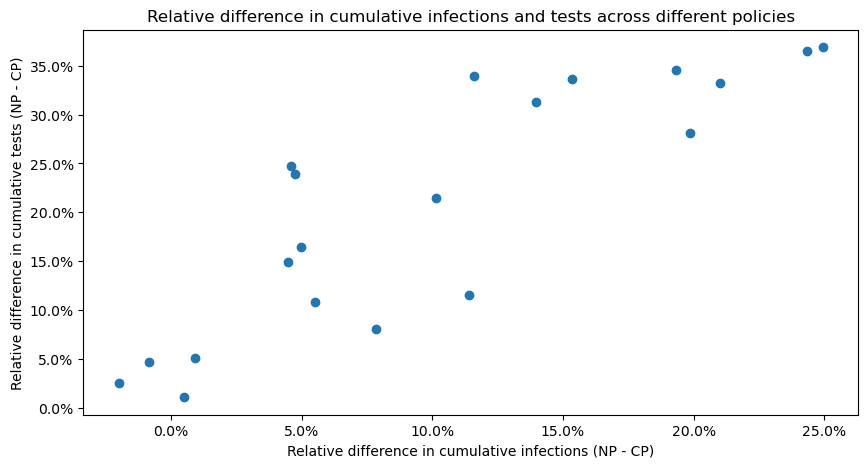

In [17]:
import matplotlib.ticker as mtick

df_sub = df[
    (df["init_prev"] == 0.01)
    # & (df["num_groups"] != 1)
    & (df["alpha"] == 2.0)
    & (df["distancing_scale"] == 50)
]

init_prev_values = np.unique(df["init_prev"])
colordict = {
    0.001: "green",
    0.01: "blue",
    0.1: "red"
}
markerdict = {
    6.0: "*",
    7.0: "^",
    6.5: "o"
}

fillstyledict = {
    2.0: "none",
    5.0: "full",
}

plt.figure(figsize=(10,5))
for _, row in df_sub.iterrows():
    plt.scatter(
        row["cumInfections_diff_rel"], 
        row["cum_num_tests_diff_rel"], 
        # c = (np.log10(df["init_prev"])),
        # c=df_country["init_prev"].apply(lambda x: colordict[x])
        # edgecolors=colordict[row["init_prev"]],
        # marker=markerdict[row["peak_VL"]],
        # marker = "o",
        color="tab:blue",
        # facecolors="none" if row["alpha"] == 2.0 else colordict[row["init_prev"]],
        # label=f"(init_prev={row['init_prev']}, peak_VL={row['peak_VL']}, alpha={row['alpha']})"
    )
    plt.errorbar(
        row["cumInfections_diff_rel"],
        row["cum_num_tests_diff_rel"],
        
    )

# plt.hlines(0,-0.3, 0.4, color="gray", linestyle="--")
# plt.vlines(0,-0.1,0.3, color="gray", linestyle="--")
plt.xlabel("Relative difference in cumulative infections (NP - CP)")
plt.ylabel("Relative difference in cumulative tests (NP - CP)")

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# plt.xscale('log')

plt.title("Relative difference in cumulative infections and tests across different policies")
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
# plt.savefig("../../figures/relative_diff.pdf", bbox_inches='tight')

Text(0.5, 1.0, 'Cumulative infections vs. test consumption across different policies')

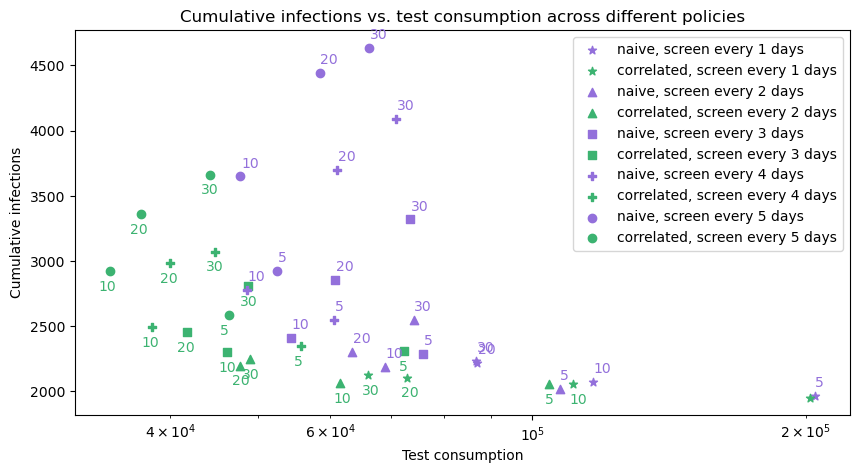

In [28]:
# non pareto version


df_sub = df[
    (df["init_prev"] == 0.01)
    & (df["distancing_scale"] == 50)
    & (df["alpha"] == 2.0)
]

init_prev_values = np.unique(df["init_prev"])

markerdict = { # screening frequency
    1: "*",
    2: "^",
    3: "s",
    4: "P",
    5: "o"
}

plt.figure(figsize=(10,5))
legends = {}

pareto_np = []
pareto_cp = []

for _, row in df_sub.iterrows():
    # print(row["num_groups"], row["pool_size"])
    np_result = [row["cum_num_tests_NP_mean"], row["cumInfections_NP_mean"]]
    cp_result = [row["cum_num_tests_CP_mean"], row["cumInfections_CP_mean"]]

    np_scatter = plt.scatter(
        row["cum_num_tests_NP_mean"], 
        row["cumInfections_NP_mean"], 
        marker=markerdict[row["num_groups"]],
        color="mediumpurple",
    )
    legends[f"naive, screen every {row['num_groups']} days"] = np_scatter
    plt.annotate(f"{row['pool_size']}", (row["cum_num_tests_NP_mean"]+100, row["cumInfections_NP_mean"]+70), color="mediumpurple")

    cp_scatter = plt.scatter(
        row["cum_num_tests_CP_mean"], 
        row["cumInfections_CP_mean"], 
        marker=markerdict[row["num_groups"]],
        color="mediumseagreen"
    )
    legends[f"correlated, screen every {row['num_groups']} days"] = cp_scatter
    plt.annotate(f"{row['pool_size']}", (row["cum_num_tests_CP_mean"]-1000, row["cumInfections_CP_mean"]-150), color="mediumseagreen")

plt.xlabel("Test consumption")
plt.ylabel("Cumulative infections")

plt.xscale('log')

plt.legend(legends.values(), legends.keys(), loc="upper right")

plt.title("Cumulative infections vs. test consumption across different policies")
# plt.savefig("../../figures/diff.pdf", bbox_inches='tight')

Text(0.5, 1.0, 'Cumulative infections vs. test consumption across different policies')

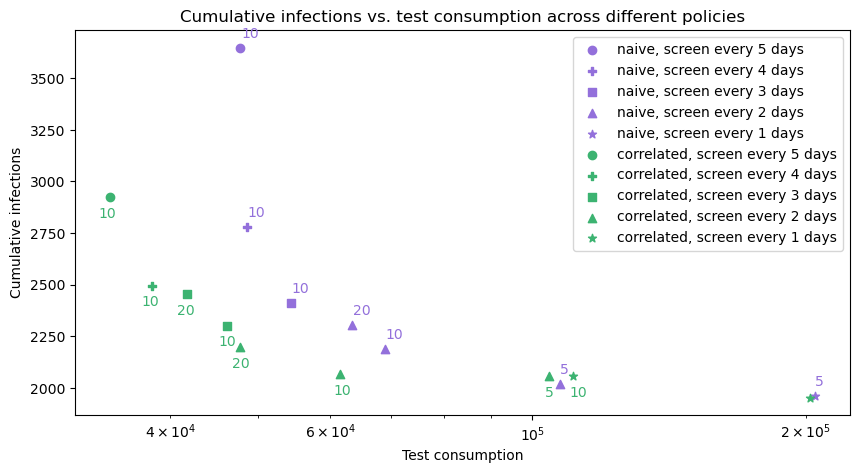

In [32]:
import matplotlib.ticker as mtick

df_sub = df[
    (df["init_prev"] == 0.01)
    & (df["distancing_scale"] == 50)
    & (df["alpha"] == 2.0)
]

init_prev_values = np.unique(df["init_prev"])

markerdict = { # screening frequency
    1: "*",
    2: "^",
    3: "s",
    4: "P",
    5: "o"
}

plt.figure(figsize=(10,5))
legends = {}

pareto_np = []
pareto_cp = []

for row_idx, row in df_sub.iterrows():
    np_result = [row["cum_num_tests_NP_mean"], row["cumInfections_NP_mean"], row["num_groups"], row["pool_size"]]
    cp_result = [row["cum_num_tests_CP_mean"], row["cumInfections_CP_mean"], row["num_groups"], row["pool_size"]]
    pareto_np.append(np_result)
    pareto_cp.append(cp_result)

# sort pareto_np and pareto_cp by num_tests in ascending order
# in each np/cp list, the point with the smallest num_tests cannot be dominated by any other point

pareto_np.sort(key=lambda x: x[0])
pareto_cp.sort(key=lambda x: x[0])

# then, iterate through the sorted list and keep only points not dominated by the previous point
# it suffices to compare the kth with the k-1 th point only, because k-1 th point is not dominated by any point before it (ie must have lower cum infections)
# so if the kth point has lower cum infections than the k-1 th point, then it has lower cum infections than (is not dominated by) any point before it

pareto_np_ = [pareto_np[0]]
for i in range(1, len(pareto_np)):
    if pareto_np[i][1] < pareto_np_[-1][1]:
        pareto_np_.append(pareto_np[i])

pareto_cp_ = [pareto_cp[0]]
for i in range(1, len(pareto_cp)):
    if pareto_cp[i][1] < pareto_cp_[-1][1]:
        pareto_cp_.append(pareto_cp[i])

for i in range(len(pareto_np_)):
    num_tests, cum_infections, num_groups, pool_size = pareto_np_[i]
    np_scatter = plt.scatter(
        num_tests,
        cum_infections,
        marker=markerdict[num_groups],
        color="mediumpurple",
    )
    legends[f"naive, screen every {num_groups} days"] = np_scatter
    plt.annotate(f"{pool_size}", (num_tests+100, cum_infections+50), color="mediumpurple")

for i in range(len(pareto_cp_)):
    num_tests, cum_infections, num_groups, pool_size = pareto_cp_[i]
    cp_scatter = plt.scatter(
        num_tests,
        cum_infections,
        marker=markerdict[num_groups],
        color="mediumseagreen",
    )
    legends[f"correlated, screen every {num_groups} days"] = cp_scatter
    plt.annotate(f"{pool_size}", (num_tests-1000, cum_infections-100), color="mediumseagreen")

plt.xlabel("Test consumption")
plt.ylabel("Cumulative infections")

plt.xscale('log')

plt.legend(legends.values(), legends.keys(), loc="upper right")

plt.title("Cumulative infections vs. test consumption across different policies")
# plt.savefig("../../figures/diff.pdf", bbox_inches='tight')

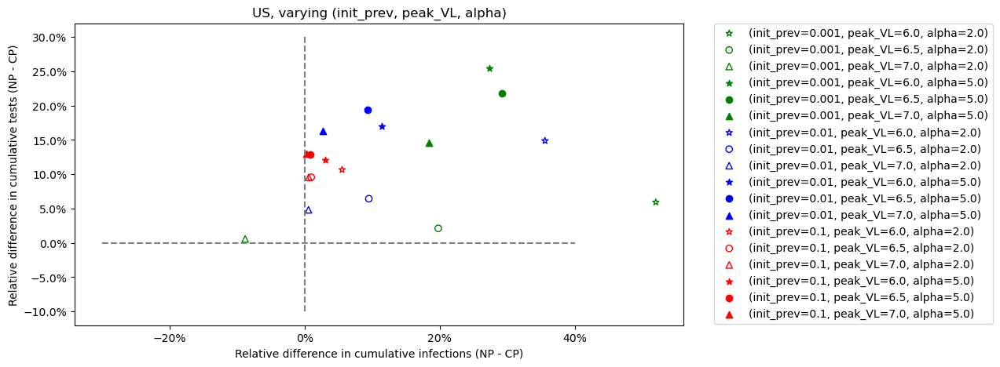

In [22]:
import matplotlib.ticker as mtick

df_country = df[df["country"] == "US"]

init_prev_values = np.unique(df["init_prev"])
colordict = {
    0.001: "green",
    0.01: "blue",
    0.1: "red"
}
markerdict = {
    6.0: "*",
    7.0: "^",
    6.5: "o"
}

fillstyledict = {
    2.0: "none",
    5.0: "full",
}

plt.figure(figsize=(10,5))
for _, row in df_country.iterrows():
    plt.scatter(
        row["cumInfections_diff_rel"], 
        row["cum_num_tests_diff_rel"], 
        # c = (np.log10(df["init_prev"])),
        # c=df_country["init_prev"].apply(lambda x: colordict[x])
        edgecolors=colordict[row["init_prev"]],
        marker=markerdict[row["peak_VL"]],
        facecolors="none" if row["alpha"] == 2.0 else colordict[row["init_prev"]],
        label=f"(init_prev={row['init_prev']}, peak_VL={row['peak_VL']}, alpha={row['alpha']})"
    )

plt.hlines(0,-0.3, 0.4, color="gray", linestyle="--")
plt.vlines(0,-0.1,0.3, color="gray", linestyle="--")
plt.xlabel("Relative difference in cumulative infections (NP - CP)")
plt.ylabel("Relative difference in cumulative tests (NP - CP)")

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.gca().xaxis.set_major_formatter(mtick.PercentFormatter(1.0))


plt.title("US, varying (init_prev, peak_VL, alpha)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)